<a href="https://colab.research.google.com/github/SHUBHAM54444/CAPSTAN_PROJECT5444/blob/main/Unsupervised_Machine_Learning_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**- NETFLIX MOVIES AND TV SHOWS CLUSTERING

##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual
##### **Name -**          - Shubham Raju Kadu

# **Project Summary -** Netflix, the world’s largest on-demand internet streaming media and online DVD movie rental service provider.it Founded August 29, 1997, in Los Gatos, California by Marc and Reed. It has 69 million members in over 60 countries enjoying more than 100 million hours of TV shows and movies per day Netflix is the world’s leading internet entertainment service with enjoying TV series, documentaries, and feature films across a wide variety of genres and languages. I was curious to analyze the content released in Netflix platform which led me to create these simple, interactive, and exciting visualizations and find similar groups of people.




This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Fixable which is a third-party Netflix search engine. In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset. Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

# **GitHub Link -**

# **Problem Statement**


This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [53]:
# Import Libraries

import numpy as np
import pandas as pd
from numpy import math
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from matplotlib.pyplot import figure
import plotly.graph_objects as go
import plotly.offline as py
import plotly.express as px
from datetime import datetime as dt

from wordcloud import WordCloud, STOPWORDS
import re, string, unicodedata

import nltk
from bs4 import BeautifulSoup
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import string
string.punctuation
nltk.download('omw-1.4')
from nltk.tokenize import TweetTokenizer

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


### Dataset Loading

In [54]:
# mount google drive
from google.colab import drive 
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [55]:
# loading datset
df=pd.read_csv("/content/drive/MyDrive/SRK/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv")

### Dataset First View

In [5]:
# Frist viwe of dataset
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [6]:
df.shape
# 12 Columns and 7787 Row 

(7787, 12)

### Dataset Information

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [8]:
# Now we find duplicte value in our data
len(df[df.duplicated()])

0

 #### Missing Values/Null Values

In [9]:
# Now we find null value in our dataset
print(df.isnull().sum())

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64


This five columns null values are present.

director        2389

cast             718

country          507

date_added        10

rating             7







<Axes: >

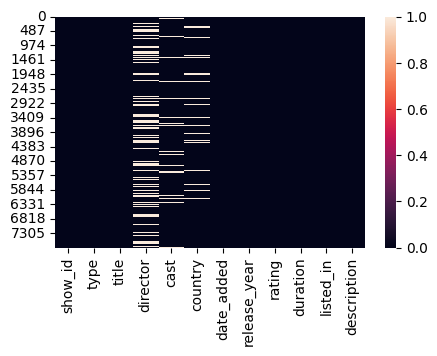

In [10]:
# We use heatmap for Visualizing the missing values
plt.figure(figsize=(5,3))
sns.heatmap(df.isnull())

### What did you know about your dataset?

In that dataset this column null value there 1. director=2389,cast    =718,country=507,date_added=10.

## ***2. Understanding Your Variables***

In [11]:
# Dataset columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [12]:
# Dataset Describe
df.describe(include='all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


### Variables Description

1. show_id : Unique ID for every Movie / Tv Show

2. type : Identifier - A Movie or TV Show

3. title : Title of the Movie / Tv Show

4. director : Director of the Movie

5. cast : Actors involved in the movie / show

6. country : Country where the movie / show was produced

7. date_added : Date it was added on Netflix

8. release_year : Actual Releaseyear of the movie / show

9. rating : TV Rating of the movie / show

10. duration : Total Duration - in minutes or number of seasons

11. listed_in : Genere

12. description: The Summary description

### Check Unique Values for each variable.

In [13]:
# How many unique values present in each columns
for i in df.columns.tolist():
  print("No. of unique values in ",i,"is",df[i].nunique(),".")


No. of unique values in  show_id is 7787 .
No. of unique values in  type is 2 .
No. of unique values in  title is 7787 .
No. of unique values in  director is 4049 .
No. of unique values in  cast is 6831 .
No. of unique values in  country is 681 .
No. of unique values in  date_added is 1565 .
No. of unique values in  release_year is 73 .
No. of unique values in  rating is 14 .
No. of unique values in  duration is 216 .
No. of unique values in  listed_in is 492 .
No. of unique values in  description is 7769 .


## 3. ***Data Wrangling***

### Data Wrangling Code

In [14]:
# chake percentage of null values in dataset each columns. 
null_value=df.isnull().sum()/len(df)
print(null_value)

show_id         0.000000
type            0.000000
title           0.000000
director        0.306793
cast            0.092205
country         0.065109
date_added      0.001284
release_year    0.000000
rating          0.000899
duration        0.000000
listed_in       0.000000
description     0.000000
dtype: float64


In [15]:
# Handling the  missing  values
df[["director","cast",'country']]=df[['director',"cast","country"]].fillna("Unknow")
df["rating"]=df['rating'].fillna(df["rating"].mode()[0])
df.dropna(axis=0,inplace=True)

In [16]:
df.isnull().sum()
# Zero null values are present

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

In [17]:
# Now shape our dataset is 7777 Row and 12 columns
df.shape

(7777, 12)

In [18]:
# This is date columns when tv_show or movie added
df['date_added']

0          August 14, 2020
1        December 23, 2016
2        December 20, 2018
3        November 16, 2017
4          January 1, 2020
               ...        
7782      October 19, 2020
7783         March 2, 2019
7784    September 25, 2020
7785      October 31, 2020
7786         March 1, 2020
Name: date_added, Length: 7777, dtype: object

In [19]:
# Creat a new feature to date_added columns like date,day,year,month.
df["date_added"]=pd.to_datetime(df["date_added"])
df["day_added"]=df['date_added'].dt.day
df["year_added"]=df['date_added'].dt.year
df["month_added"]=df['date_added'].dt.month


In [20]:
df.drop('date_added',axis=1,inplace=True)

In [21]:
df.shape

(7777, 14)

In [22]:
df.head(1)

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,day_added,year_added,month_added
0,s1,TV Show,3%,Unknow,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,14,2020,8


In [23]:
# Choosing the primary country and primary genre to simplify the analysis.
df["country"]= df["country"].apply(lambda x:x.split(",")[0])
df['listed_in']=df["listed_in"].apply(lambda x:x.split(",")[0])

In [24]:
# Spliting duration columns and changing datatype into integers.
df["duration"]=df["duration"].apply(lambda x:int(x.split()[0]))

### What all manipulations have you done and insights you found?

So we fill up  null value in 'director',"cast","country" this columns with Unknow and "rating" columns value with mode. We creat some feature like day,year,month in our data. we change duration columns datatype object to integers.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

**We creat chart-1 for Type columns**

In [25]:
# We have 5377 Movies and  2400 TV Show 
df.type.value_counts()

Movie      5377
TV Show    2400
Name: type, dtype: int64

Text(0.5, 1.0, 'Movies and TV Showes in the dataset')

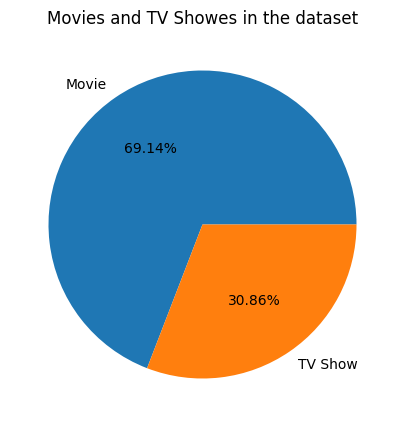

In [26]:
# No of movies and no of TV Shows
plt.figure(figsize=(5,5))
df.type.value_counts().plot(kind="pie",autopct="%1.2f%%")
plt.ylabel("")
plt.title("Movies and TV Showes in the dataset")

In this pie chart we seen 69.14% data are movies data and 30.86% data TV Show data 

**We creat chart-2 for Director columns**

In [27]:
# We seen max movies or TV show director are unknow 
df.director.value_counts()

Unknow                    2379
Raúl Campos, Jan Suter      18
Marcus Raboy                16
Jay Karas                   14
Cathy Garcia-Molina         13
                          ... 
Andrew C. Erin               1
Vibhu Virender Puri          1
Lucien Jean-Baptiste         1
Jason Krawczyk               1
Sam Dunn                     1
Name: director, Length: 4050, dtype: int64

Text(0.5, 1.0, 'TOP 15 DIRECTOR')

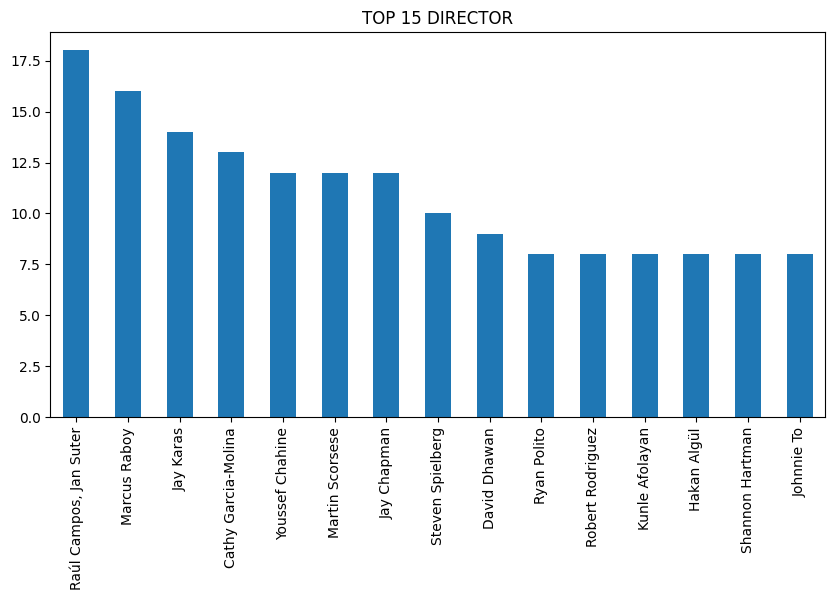

In [28]:
# We plot graph for TOP 15 director 
plt.figure(figsize=(10,5))
df[~(df['director']== "Unknow")].director.value_counts().nlargest(15).plot(kind="bar")
plt.title("TOP 15 DIRECTOR")

In this bar plot we seen TOP 15 director of Movies and TV Show. Raúl Campos & Jan Suter,Marcus Raboy,Jay Karas this are top three director.


**We creat chart-3 for Country columns**

In [29]:
# We seen united states , india have higest no of TV show and Movies
df.country.value_counts()

United States     2877
India              956
United Kingdom     576
Unknow             506
Canada             259
                  ... 
Zimbabwe             1
Namibia              1
Soviet Union         1
Iran                 1
Somalia              1
Name: country, Length: 82, dtype: int64

Text(0.5, 1.0, 'TOP 10 COUNTRY')

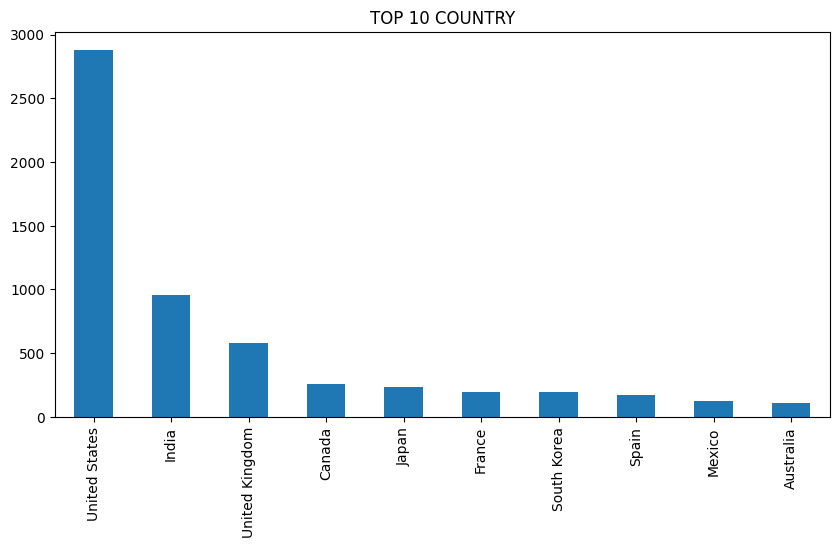

In [30]:
# Now we plot graph for top 10 country that have higest no of TV Show and Movies 
plt.figure(figsize=(10,5))
df[~(df['country']== "Unknow")].country.value_counts().nlargest(10).plot(kind="bar")
plt.title("TOP 10 COUNTRY")

In this plot we seen Top 10 country that having higest Movie and TV Show in our dataset.United States,India,United Kingdom this are top three

**We creat chart-4 release_year columns**


In [31]:
df.release_year.value_counts()

2018    1120
2017    1012
2019     996
2016     881
2020     868
        ... 
1925       1
1964       1
1966       1
1947       1
1959       1
Name: release_year, Length: 73, dtype: int64

Text(0.5, 1.0, 'Release_Year')

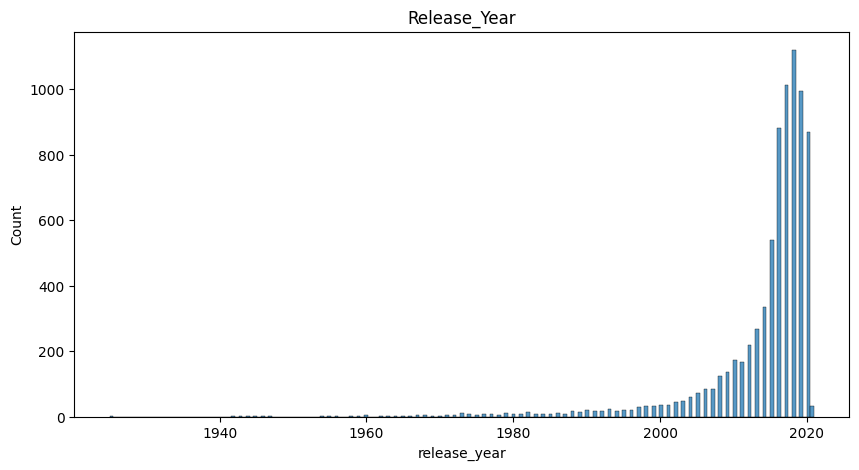

In [32]:
# We creat plot for release_year columns to see how many movies and Tv showes release in which year
plt.figure(figsize=(10,5))
sns.histplot(df["release_year"])
plt.title("Release_Year")

In this plot we seen after year 2000 Movies and TV Showes releasing continously increges as compear to before year 2000.  

**We creat chart-5 for Rating columns**

In [33]:
df.rating.value_counts()

TV-MA       2868
TV-14       1928
TV-PG        804
R            665
PG-13        386
TV-Y         279
TV-Y7        270
PG           247
TV-G         194
NR            83
G             39
TV-Y7-FV       6
UR             5
NC-17          3
Name: rating, dtype: int64

Text(0.5, 1.0, 'RATING  ')

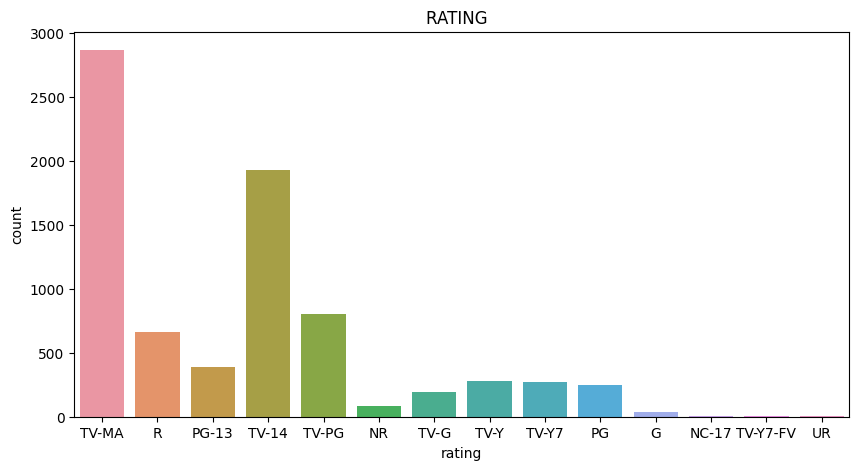

In [34]:
# Now we creat a plot for rating 
plt.figure(figsize=(10,5))
sns.countplot(x="rating",data=df)
plt.title("RATING  ")

In this plot we seen all rating count.TV-MA is higest rating and second higest rating TV-14

**We creat chart-6 for Month_added columns**

In [35]:
df.month_added.value_counts()

12    833
10    785
1     757
11    738
3     669
9     619
8     618
4     601
7     600
5     543
6     542
2     472
Name: month_added, dtype: int64

Text(0.5, 1.0, 'NO OF SHOW ADDED EACH MONTH  ')

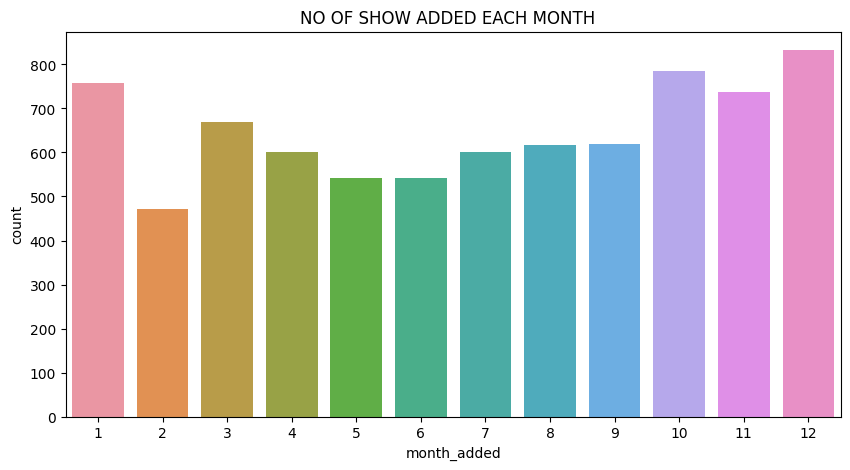

In [36]:
# Now we creat plot for month_added columns
plt.figure(figsize=(10,5))
sns.countplot(x="month_added",data=df)
plt.title("NO OF SHOW ADDED EACH MONTH  ")

In plot we seen maximum no of shows added in 12th month means december and second higest is 10th month means octomber.

**We creat chart-7 for Years_added columns**

In [37]:
df.year_added.value_counts()

2019    2153
2020    2009
2018    1685
2017    1225
2016     443
2021     117
2015      88
2014      25
2011      13
2013      11
2012       3
2008       2
2009       2
2010       1
Name: year_added, dtype: int64

Text(0.5, 1.0, 'NO OF SHOW ADDED EACH YEAR  ')

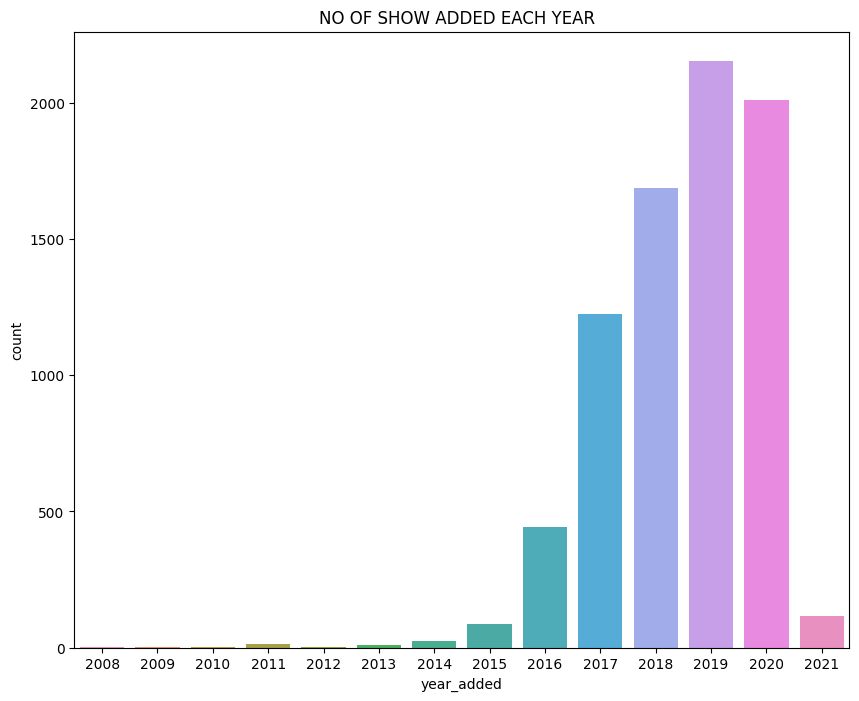

In [38]:
# No we plot graph for year_added columns
plt.figure(figsize=(10,8))
sns.countplot(x="year_added",data=df)
plt.title("NO OF SHOW ADDED EACH YEAR  ")

In this plot we can seen that max show added in 2019 and after that 2020 this  year second highest show is added.

**chart-8 for length of movies distribustion**

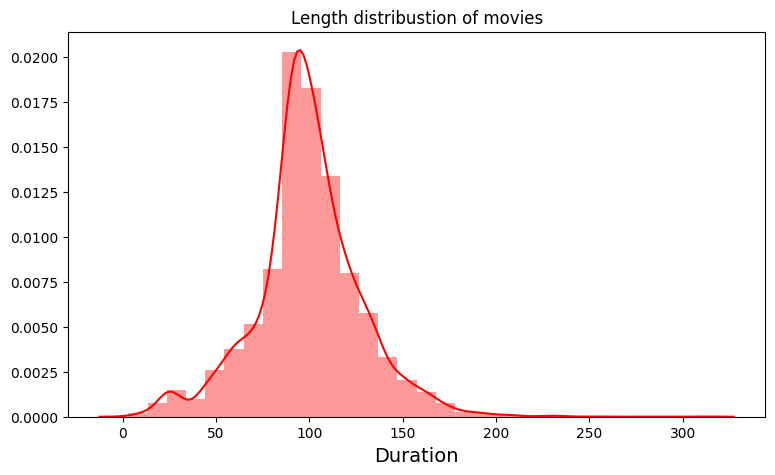

In [39]:
# Now we creat distribustion plot for movie
moviedf=df[df["type"]=="Movie"]

plt.figure(figsize=(9,5))

sns.distplot(moviedf['duration'],bins=30,color="Red").set(ylabel=None)

plt.title("Length distribustion of movies")
plt.xlabel("Duration",fontsize=14)
plt.show()

In this plot we can seen that 0 to 100 duration movies are increages and 100 to 200 movies duration was decreages. 

**Chart-9 for Distribustion of  TV Show**

In [40]:
# frist we creat data for TV Show
tv_show=df[df['type']=="TV Show"]

<Axes: title={'center': 'Distribustion of TV Show'}, xlabel='duration', ylabel='count'>

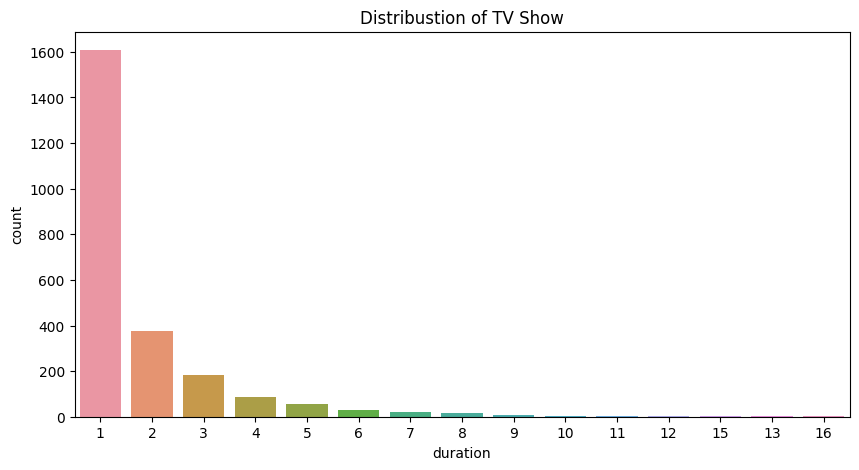

In [41]:
# Now we creating distribustion plot for TV Show
plt.figure(figsize=(10,5))
plt.title("Distribustion of TV Show")
sns.countplot(x=tv_show["duration"],data=tv_show,order=tv_show["duration"].value_counts().index)

From this chart we observed that maximum TV Show and Web searies in this dataset have only one seasion 

**Chart-10 For TOP 10 Geners**

Text(0.5, 1.0, 'TOP 10 GENERS')

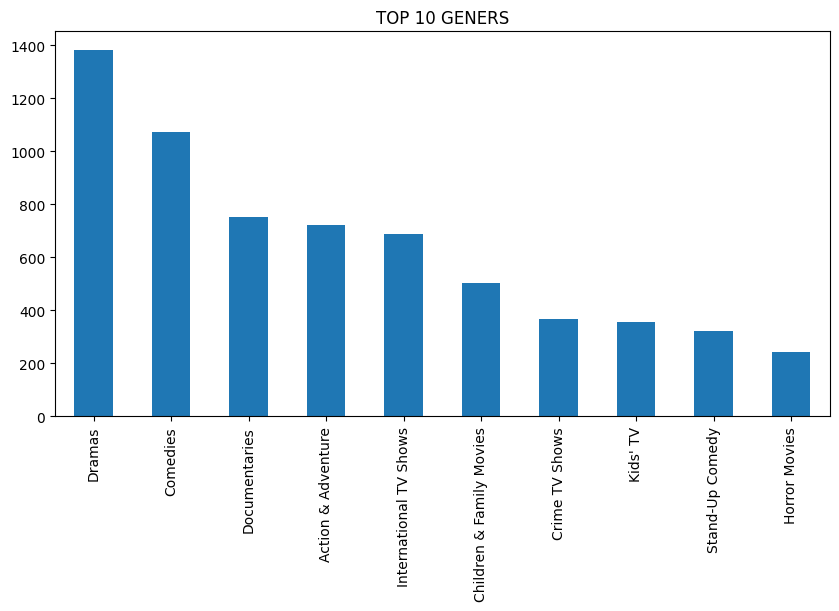

In [42]:
# Now we creat plot for TOP 10 geners
plt.figure(figsize=(10,5))
df.listed_in.value_counts().nlargest(10).plot(kind="bar")
plt.title("TOP 10 GENERS")

In this plot we can see that Dramas is large value after that comedies is second largest value.

## Bivariate and Trend Analysis

**Chart-1**

In [43]:
# Now we plot chart for top 10 cast for movies and TV Show
df['cast']

0       João Miguel, Bianca Comparato, Michel Gomes, R...
1       Demián Bichir, Héctor Bonilla, Oscar Serrano, ...
2       Tedd Chan, Stella Chung, Henley Hii, Lawrence ...
3       Elijah Wood, John C. Reilly, Jennifer Connelly...
4       Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...
                              ...                        
7782    Imad Creidi, Antoinette Turk, Elias Gergi, Car...
7783    Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...
7784                                              Nasty C
7785                           Adriano Zumbo, Rachel Khoo
7786                                               Unknow
Name: cast, Length: 7777, dtype: object

In [44]:
# Now we seprate actor from cast columns
cast=df['cast'].str.split(',',expand=True).stack()

cast.value_counts()

Unknow                 718
 Anupam Kher            38
 Takahiro Sakurai       28
Shah Rukh Khan          27
 Om Puri                27
                      ... 
 Ana-María Sánchez       1
 Orlando Valenzuela      1
 Ricardo Mejia           1
 Juan Manuel Diaz        1
 Rachel Khoo             1
Length: 35339, dtype: int64

In [45]:
# we remove unknow cast Row
cast=cast[cast != "Unknow"]
cast.value_counts()

 Anupam Kher           38
 Takahiro Sakurai      28
Shah Rukh Khan         27
 Om Puri               27
 Boman Irani           25
                       ..
 Ana-María Sánchez      1
 Orlando Valenzuela     1
 Ricardo Mejia          1
 Juan Manuel Diaz       1
 Rachel Khoo            1
Length: 35338, dtype: int64

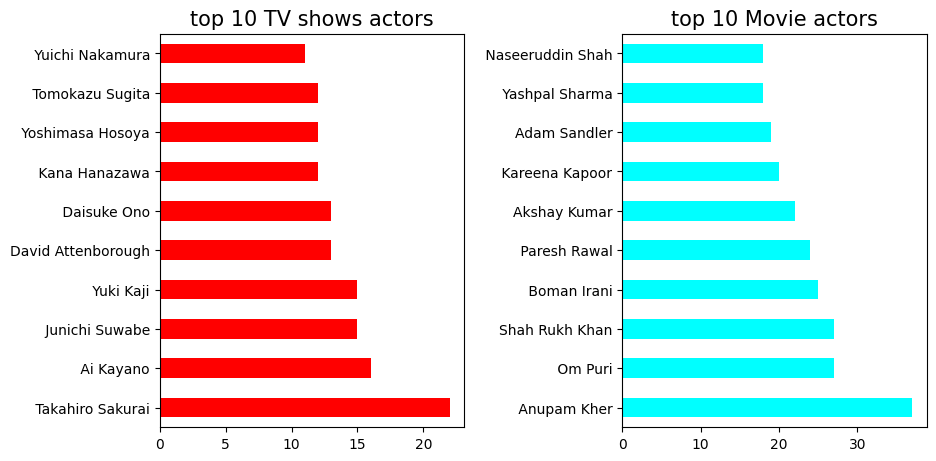

In [46]:
# Now we plot graph for TOP 10  movies and  TV Show 
fig,ax=plt.subplots(1,2, figsize=(10,5))
# Seprating TV show actor from cast columns
top_tv_show_actor=df[df["type"]=="TV Show"]["cast"].str.split(',',expand=True).stack()
top_tv_show_actor=top_tv_show_actor[top_tv_show_actor != "Unknow"]
a=top_tv_show_actor.value_counts().head(10).plot(kind="barh",ax=ax[0],color="red")
a.set_title("top 10 TV shows actors",size=15)

# seprating movie actor from cast columns

top_movie_actor=df[df["type"]=="Movie"]["cast"].str.split(',',expand=True).stack()
top_movie_actor=top_movie_actor[top_movie_actor != "Unknow"]
b=top_movie_actor.value_counts().head(10).plot(kind="barh",ax=ax[1],color="Cyan")
b.set_title("top 10 Movie actors",size=15)

plt.tight_layout(pad=1.2,rect=[0,0,0.95,0.95])
plt.show()


In this plot we seen most of TV Show actor is Takahiro sakurai and most of the Movies actor is Anupam kher.

**Chart-2**

## All country's genres preference were plotted

In [64]:
#genre country wise
def get_genre_country_trends(df):
  def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""
  df['country_list'] = df.apply(lambda x: explode_country(x['country']),axis=1)
  df = df.explode('country_list')
  df['genre_list'] = df.apply(lambda x: explode_country(x['listed_in']),axis=1)
  df = df.explode('genre_list')
  df.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df_ = df.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for each in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == each].sort_values("title",ascending=False).plot.bar(x = "genre_list", y="title", color="skyblue", rot=90, figsize=(9,5))
    plt.title(f"{each}")
  return rating_country_df

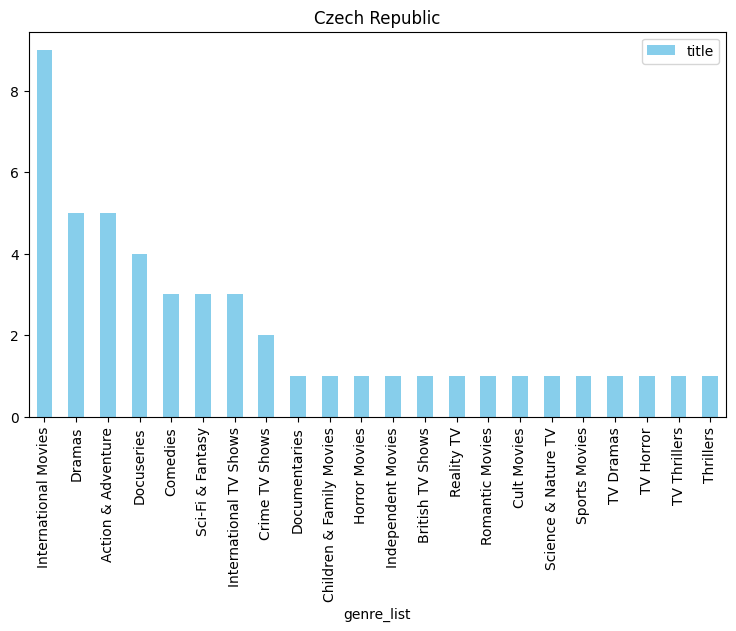

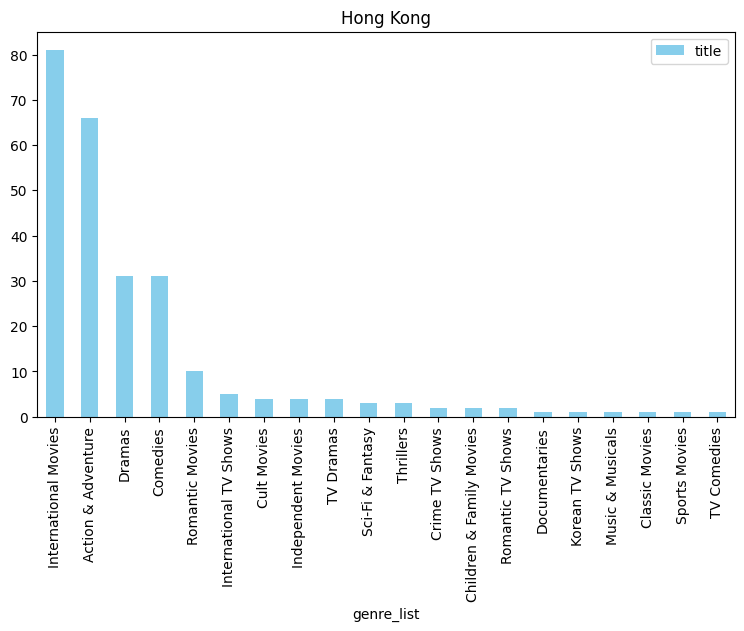

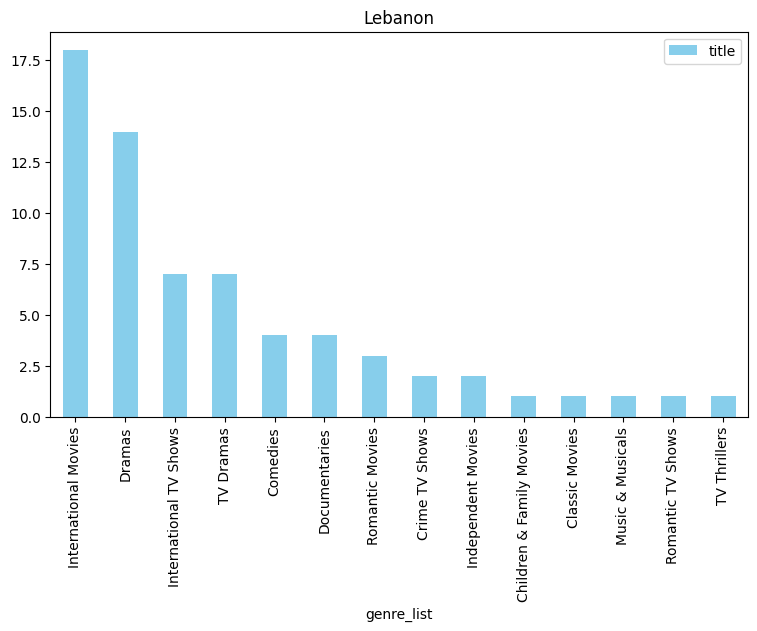

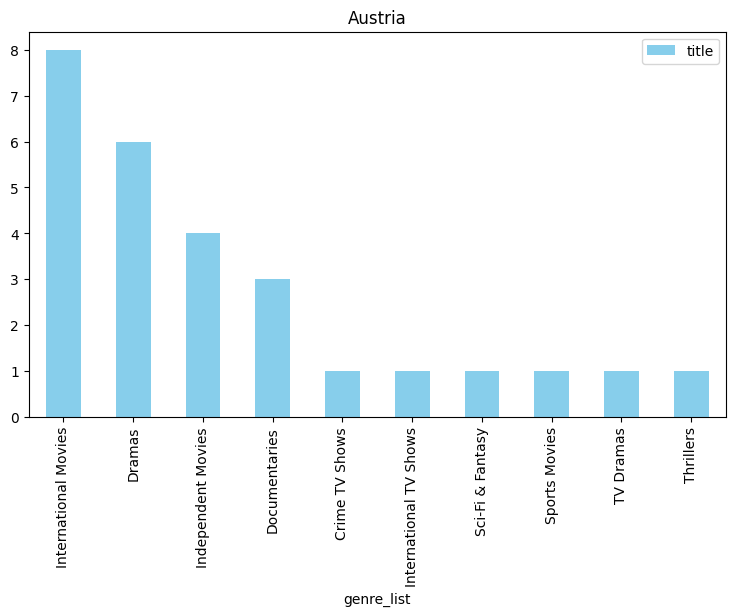

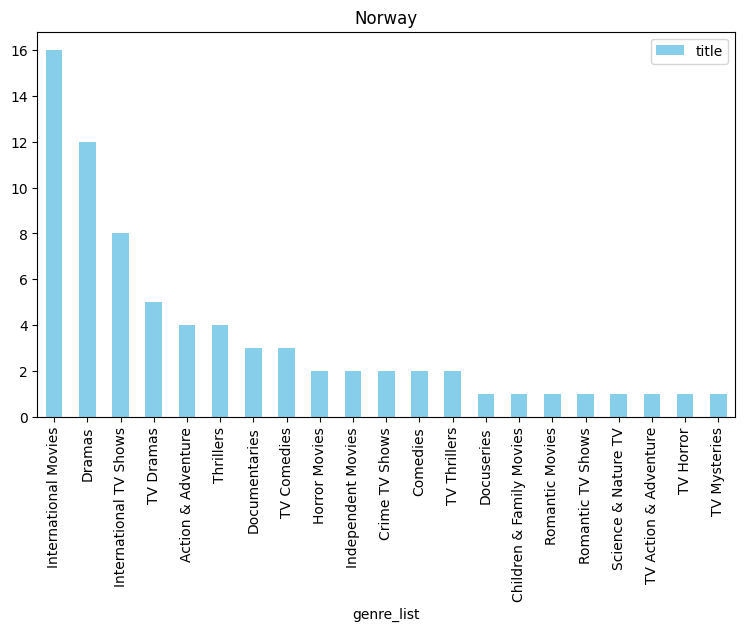

...

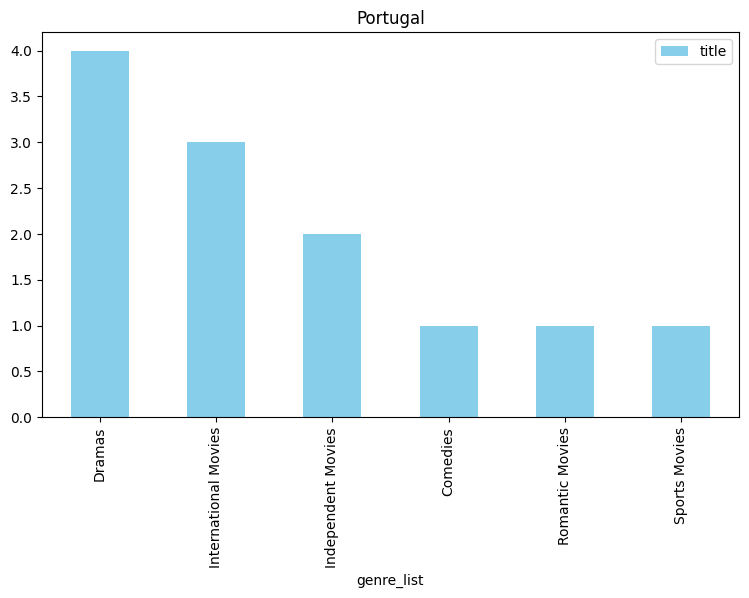

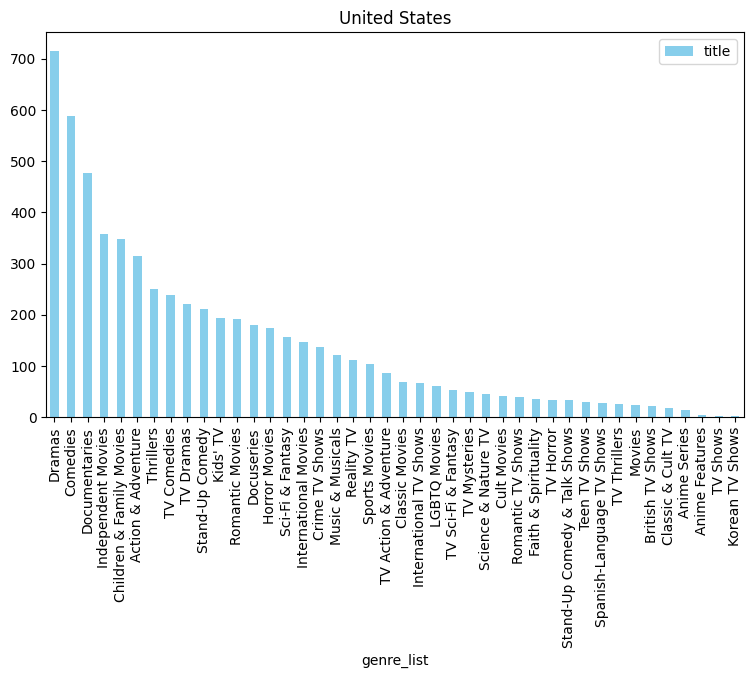

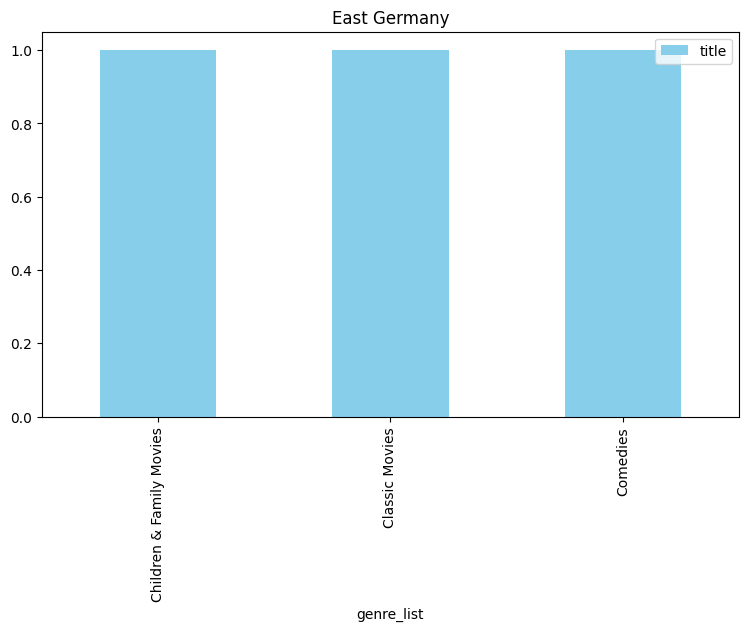

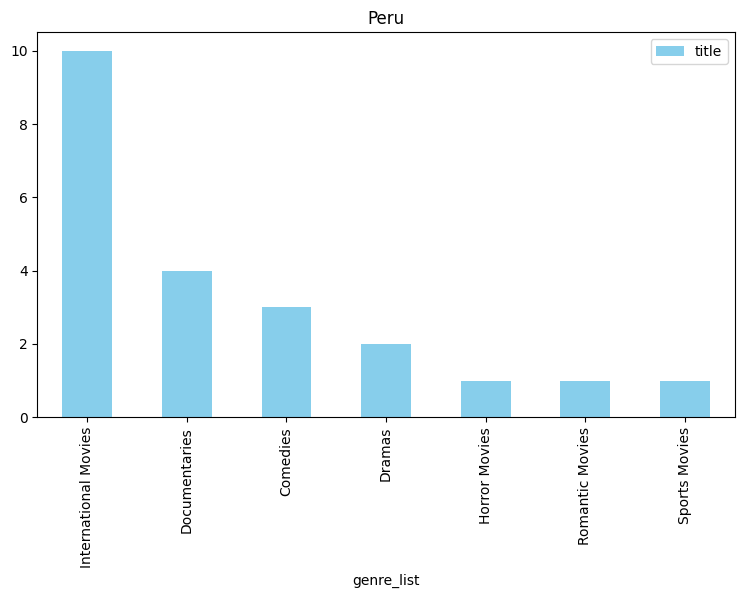

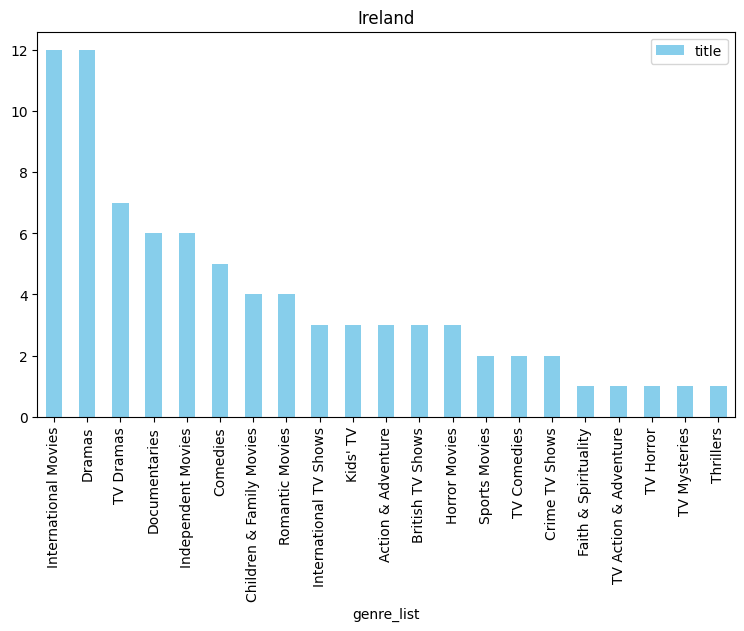

In [65]:
rating_country_df = get_genre_country_trends(df)

**Chart-3**

##Plotting country wise preferred rating for all countries

In [66]:
#getting country wise rating trend
def get_country_ratings_trends(df):
  def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""
  df['country_list'] = df.apply(lambda x: explode_country(x['country']),axis=1)
  df = df.explode('country_list')
  grouped_df_ = df.groupby(['country_list','rating']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for each in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == each].sort_values("title",ascending=False).plot.bar(x = "rating", y="title", color="khaki", rot=45, figsize=(5,5))
    plt.title(f"{each}")

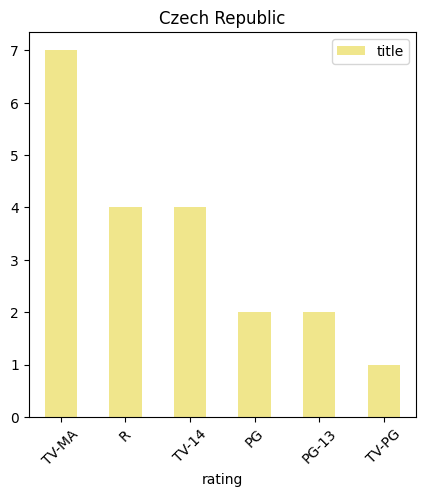

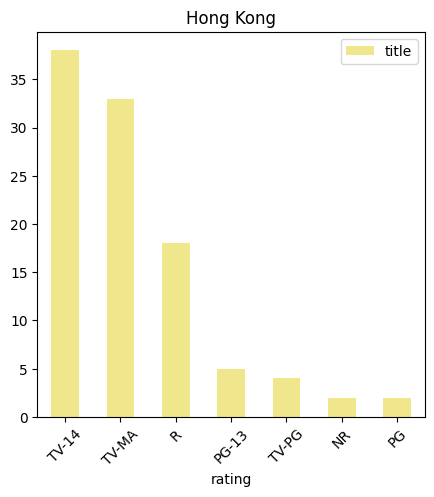

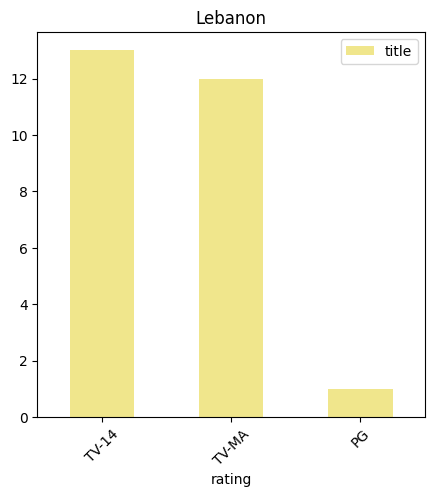

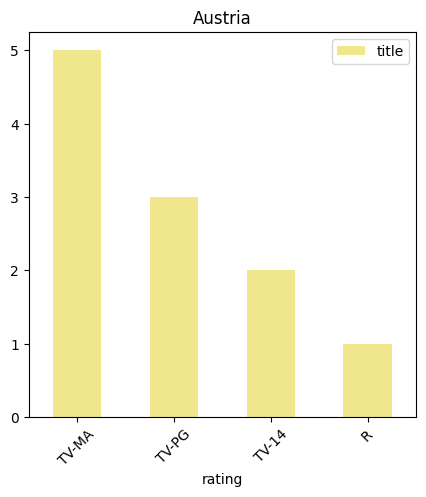

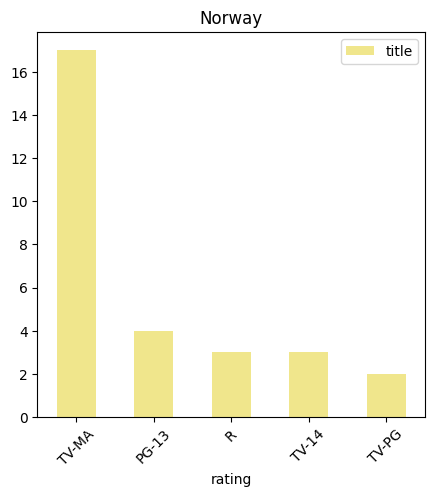

...

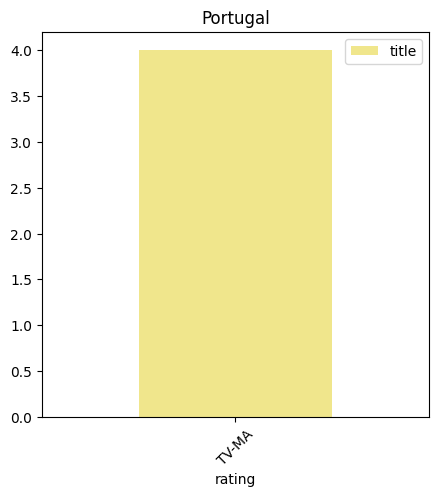

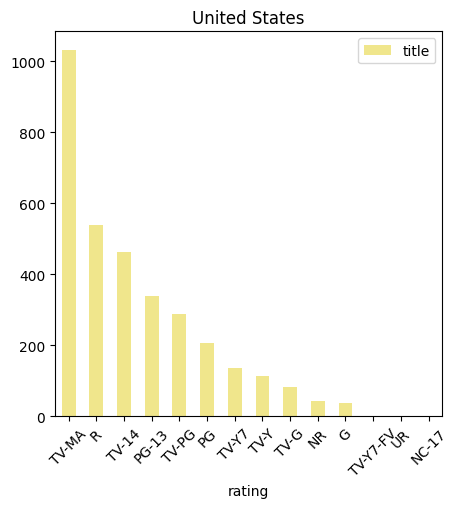

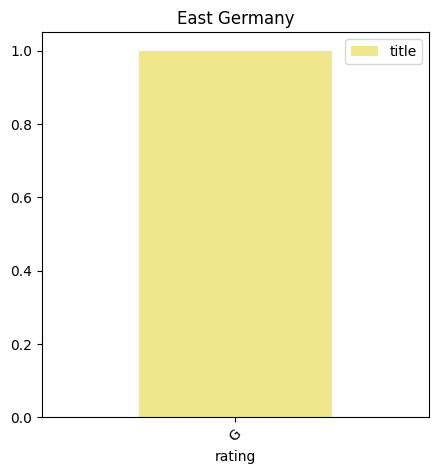

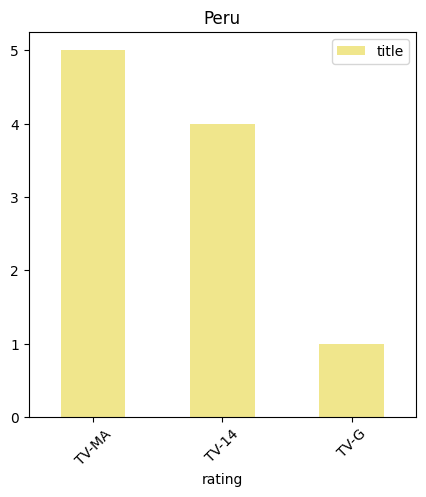

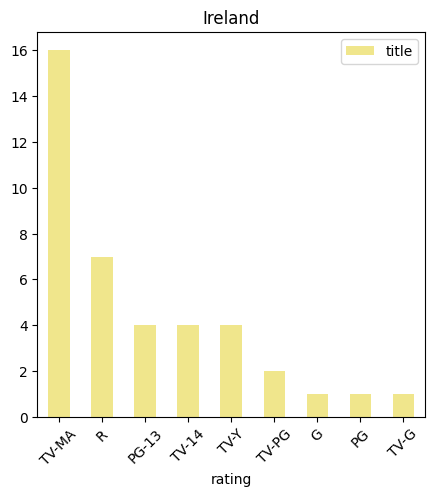

In [67]:
 get_country_ratings_trends(df)

**chart-3**

##Plotting country wise preferred 'type' for all countries

In [68]:
#get all country type preference
def get_country_type_trends(df):
  def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""
  df['country_list'] = df.apply(lambda x: explode_country(x['country']),axis=1)
  df = df.explode('country_list')
  grouped_df_ = df.groupby(['country_list','type']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for each in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == each].sort_values("title",ascending=False).plot.bar(x = "type", y="title", color="slateblue", rot=45, figsize=(5,5))
    plt.title(f"{each}")

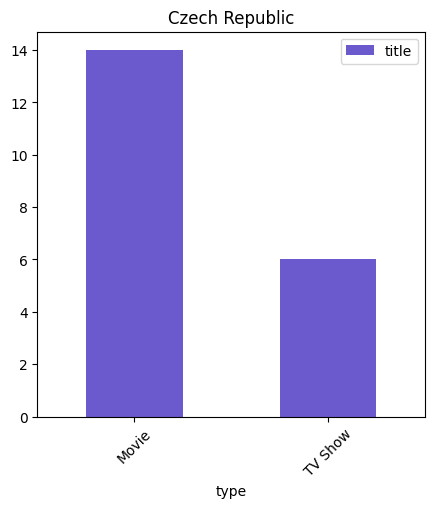

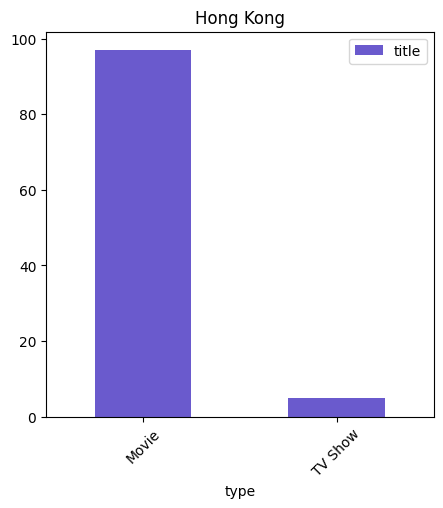

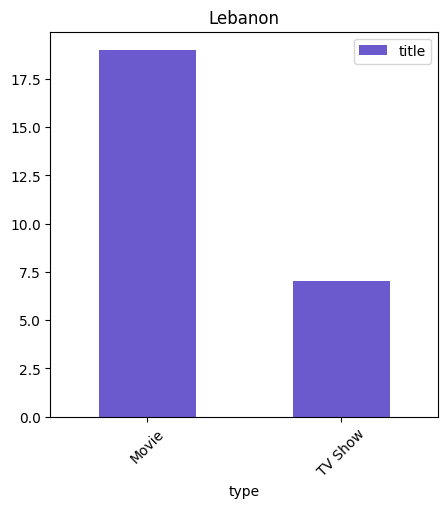

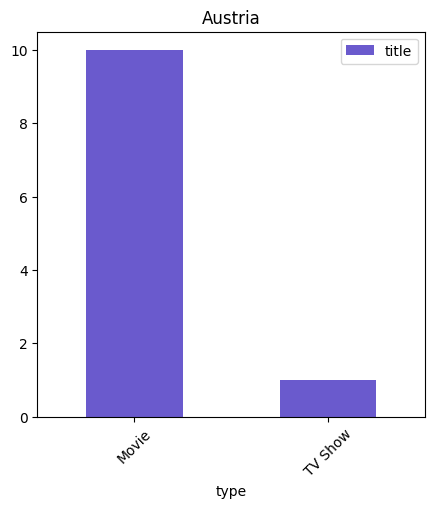

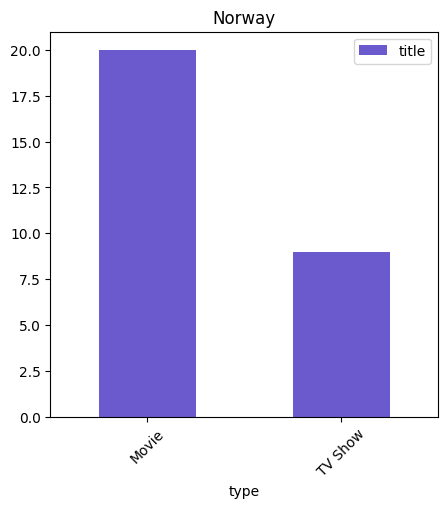

...

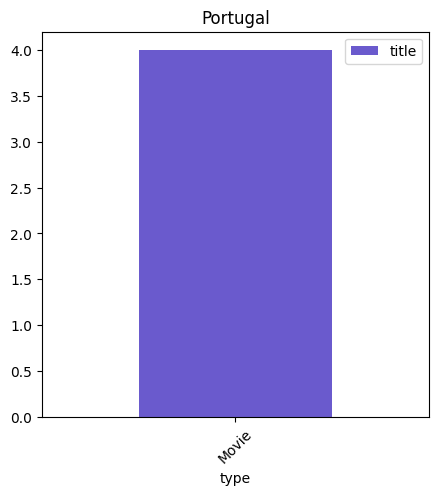

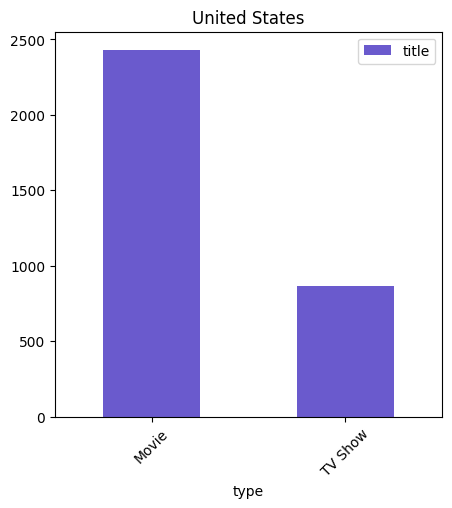

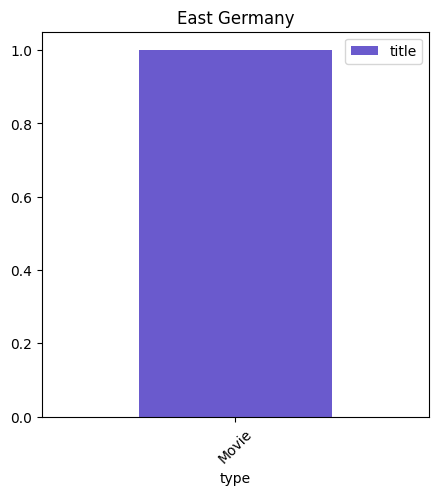

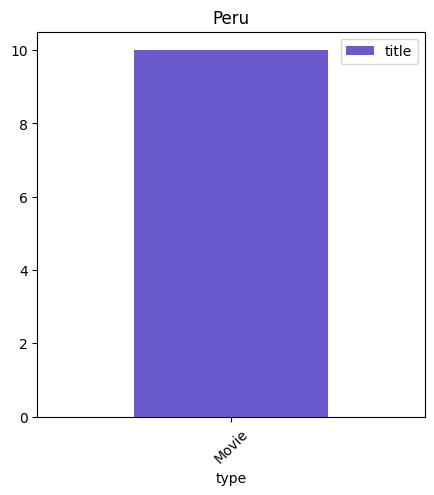

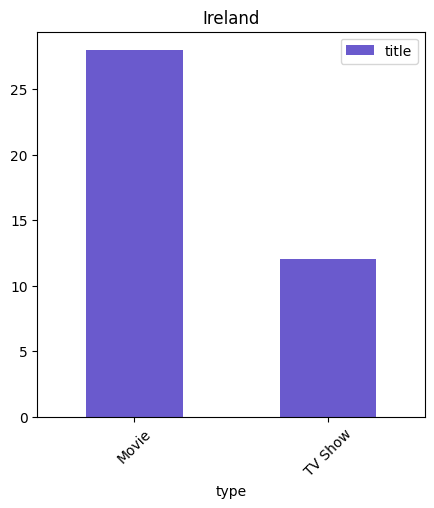

In [69]:
get_country_type_trends(df)

**Chart-4**

## Word Cloud for countries like US, India, UK, France, Canada etc.

In [70]:
def get_word_clouds(rating_country_df):
  country_list_ = ["United States", "India", "United Kingdom", "France", "Canada"]
  from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
  for each in country_list_:
    plt.rcParams['figure.figsize'] = (10, 10)
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color = 'white', width = 1000,  height = 500, max_words = 121).generate(' '.join(rating_country_df[rating_country_df["country_list"]==each]['genre_list']))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f'Most popular genres for {each}',fontsize = 30)
    plt.show()

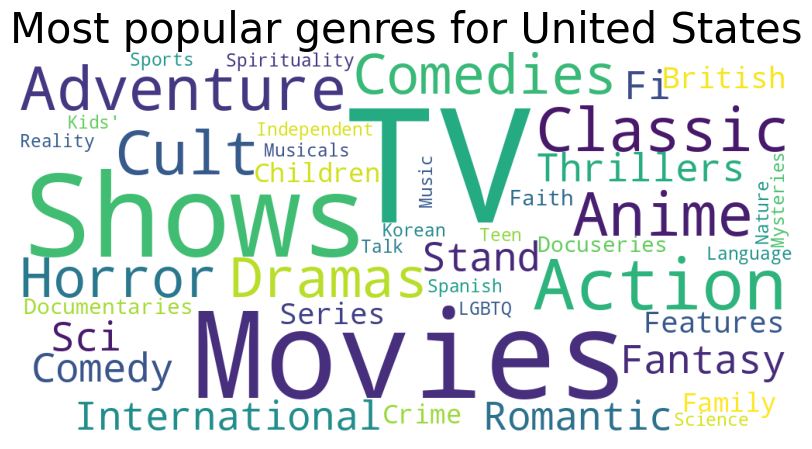

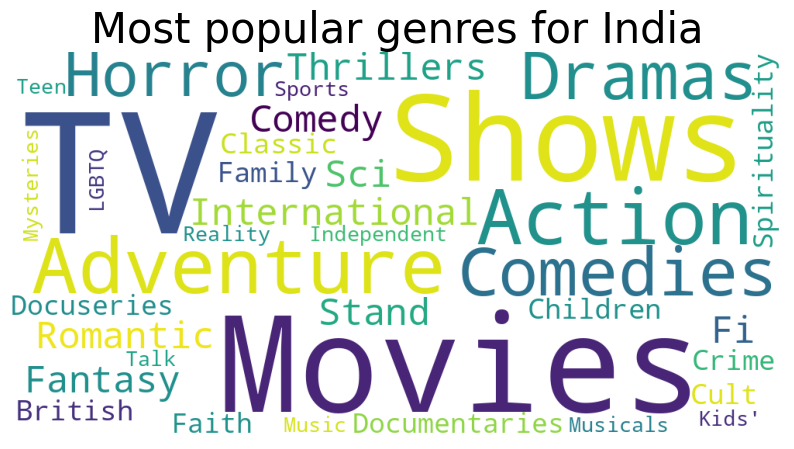

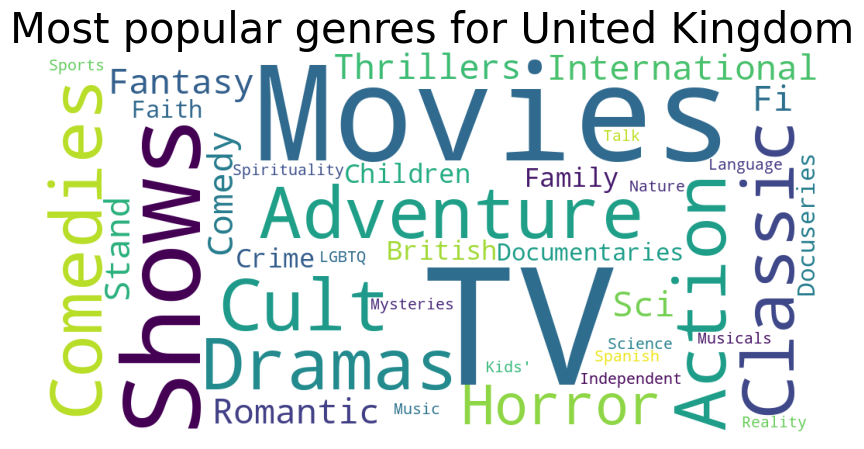

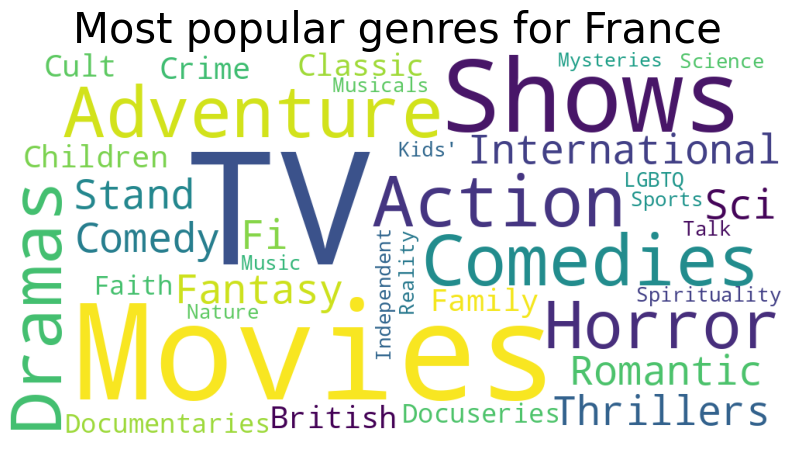

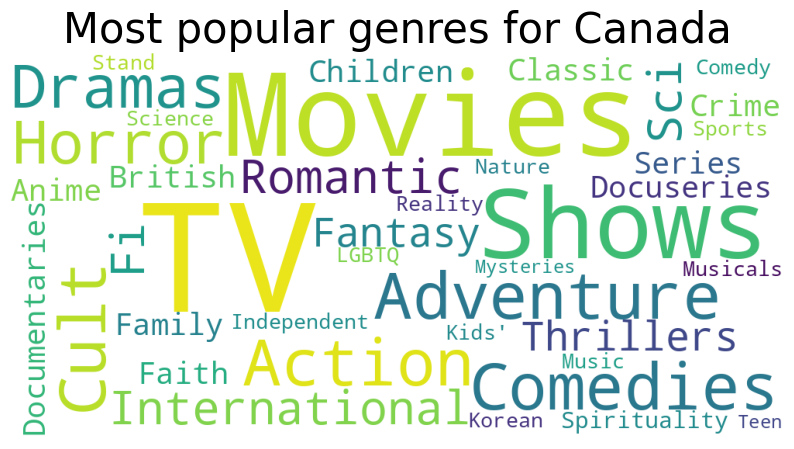

In [71]:
get_word_clouds(rating_country_df)

# **Data Processing**

In [ ]:
# Using the original dataset for clustering since
# it does not require handling missing values
Dataset = df.copy()

In [ ]:
Dataset.fillna('',inplace=True)

In [ ]:
# Combining all the clustering attributes into a single column

Dataset['clustering'] = (Dataset['director'] + ' ' + 
                                Dataset['cast'] +' ' + 
                                Dataset['country'] +' ' + 
                                Dataset['listed_in'] +' ' + 
                                Dataset['description'])

In [ ]:
# Select the 100 number of clusters for the dataset 
Dataset['clustering'][100]

"Rajkumar Hirani Aamir Khan, Kareena Kapoor, Madhavan, Sharman Joshi, Omi Vaidya, Boman Irani, Mona Singh, Javed Jaffrey India Comedies While attending one of India's premier colleges, three miserable engineering students and best friends struggle to beat the school's draconian system."

# **Removing Punctuation**

In [ ]:
# function to remove punctuations
def remove_punctuation(text):
    '''a function for removing punctuation'''
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [ ]:
# Removing punctuation marks
Dataset['clustering'] = Dataset['clustering'].apply(remove_punctuation)

In [ ]:
# Select the 100 number of clusters for the dataset 
Dataset['clustering'][100]

'Rajkumar Hirani Aamir Khan Kareena Kapoor Madhavan Sharman Joshi Omi Vaidya Boman Irani Mona Singh Javed Jaffrey India Comedies While attending one of Indias premier colleges three miserable engineering students and best friends struggle to beat the schools draconian system'

# **Removing non-ASCII characters:**

In [ ]:
# function to remove non-ascii characters

def remove_non_ascii(words):
    """Function to remove non-ASCII characters"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

In [ ]:
# remove non-ascii characters
Dataset['clustering'] = remove_non_ascii(Dataset['clustering'])

In [ ]:
# Select the 100 number of clusters for the dataset 
Dataset['clustering'][100]

'Rajkumar Hirani Aamir Khan Kareena Kapoor Madhavan Sharman Joshi Omi Vaidya Boman Irani Mona Singh Javed Jaffrey India Comedies While attending one of Indias premier colleges three miserable engineering students and best friends struggle to beat the schools draconian system'

# **Removing stopwords**

In [ ]:
# extracting the stopwords from nltk library
import nltk
from nltk.corpus import stopwords
sentences = stopwords.words('english')
# displaying the stopwords
np.array(sentences)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
# function to remove stop words
def remove_stopwords(text):
    '''a function for removing the stopword'''
    # removing the stop words and lowercasing the selected words
    text = [word.lower() for word in text.split() if word.lower() not in sentences]
    # joining the list of words with space separator
    return " ".join(text)

In [ ]:
# Removing stop words
Dataset['clustering'] = Dataset['clustering'].apply(remove_stopwords)

In [ ]:
# Select the 100 number of clusters for the dataset 
Dataset['clustering'][100]

'rajkumar hirani aamir khan kareena kapoor madhavan sharman joshi omi vaidya boman irani mona singh javed jaffrey india comedies attending one indias premier colleges three miserable engineering students best friends struggle beat schools draconian system'

# **Removing  Lemmatization:**

In [ ]:

# function to lemmatize the corpus
def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

In [ ]:
# Lemmatization
Dataset['clustering'] = lemmatize_verbs(Dataset['clustering'])

In [ ]:
# Select the 100 number of clusters for the dataset 
print(Dataset['clustering'][100])

rajkumar hirani aamir khan kareena kapoor madhavan sharman joshi omi vaidya boman irani mona singh javed jaffrey india comedies attending one indias premier colleges three miserable engineering students best friends struggle beat schools draconian system


# **Tokenization:**

In [ ]:
# Create a reference variable for Class TweetTokenizer
tokenizer = TweetTokenizer()

In [ ]:
# Create text column based on dataset
Dataset['clustering'] = Dataset['clustering'].apply(lambda x: tokenizer.tokenize(x))

In [ ]:
# Select the 100 number of Tokenization for the dataset 
print(Dataset['clustering'][100])

['rajkumar', 'hirani', 'aamir', 'khan', 'kareena', 'kapoor', 'madhavan', 'sharman', 'joshi', 'omi', 'vaidya', 'boman', 'irani', 'mona', 'singh', 'javed', 'jaffrey', 'india', 'comedies', 'attending', 'one', 'indias', 'premier', 'colleges', 'three', 'miserable', 'engineering', 'students', 'best', 'friends', 'struggle', 'beat', 'schools', 'draconian', 'system']


# **Vectorization:**

In [ ]:
# clustering tokens saved in a variable
clustering_vectorization = Dataset['clustering']

In [ ]:
# Tokenization
def tokenizer(text):
  return text

# Using TFIDF vectorizer to vectorize the corpus 
# max features = 20000 to prevent system from crashing
tfidf = TfidfVectorizer(tokenizer=tokenizer, stop_words='english', lowercase=False,max_features = 20000)    
x = tfidf.fit_transform(clustering_vectorization)

In [ ]:
# Dataset Rows & Columns count
x.shape

(7777, 20000)

In [ ]:
# convert X into array form for clustering
X = x.toarray()

In [ ]:
# Check the matrix
X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

#**Reduceing Diemensionality using PCA**

In [ ]:
# using PCA to reduce dimensionality
pca = PCA(random_state=40)
pca.fit(X)

PCA(random_state=40)

Text(0, 0.5, 'cumulative explained variance')

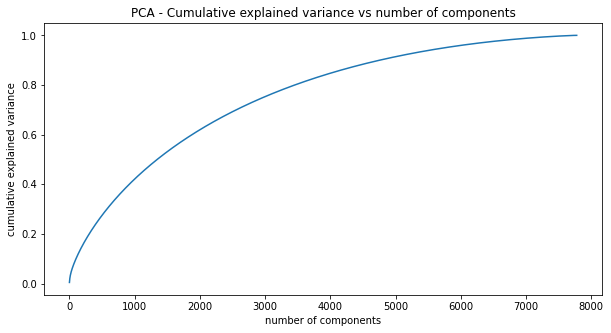

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs number of components')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [ ]:
# reducing the dimensions to 4000 using pca
pca = PCA(n_components=4000,random_state=40)
pca.fit(X)

PCA(n_components=4000, random_state=40)

In [ ]:
# transformed features
x_pca = pca.transform(X)

In [ ]:
# shape of transformed vectors
x_pca.shape

(7777, 4000)

# **Unservised Machine Learning clustering algorithms**

##**1.K-Means Clustering:**

Text(0, 0.5, 'WCSS')

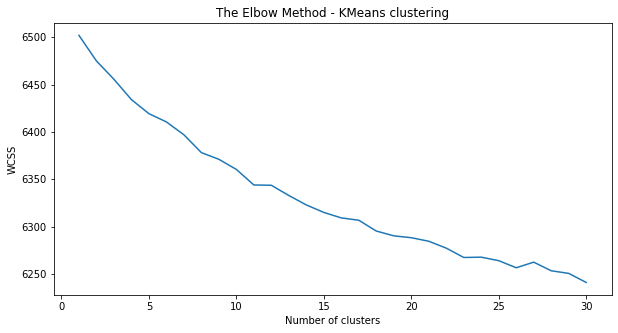

In [ ]:
# Elbow method to find the optimal value of k
wcss=[]
for i in range(1,31):
  kmeans = KMeans(n_clusters=i,init='k-means++',random_state=33)
  kmeans.fit(x_pca)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_clusters = range(1,31)
plt.figure(figsize=(10,5))
plt.plot(number_clusters,wcss)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

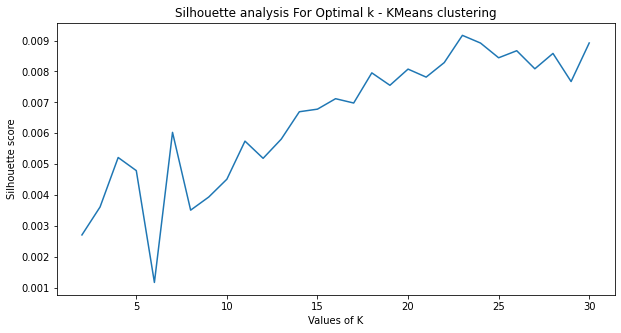

In [ ]:
# Plotting Silhouette score for different umber of clusters
range_n_clusters = range(2,31)
silhouette_avg = []
for num_clusters in range_n_clusters:
  # initialize kmeans
  kmeans = KMeans(n_clusters=num_clusters,init='k-means++',random_state=33)
  kmeans.fit(x_pca)
  cluster_labels = kmeans.labels_
 
  # silhouette score
  silhouette_avg.append(silhouette_score(x_pca, cluster_labels))

plt.figure(figsize=(10,5))
plt.plot(range_n_clusters,silhouette_avg)
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [ ]:
# Clustering the data into 19 clusters
kmeans = KMeans(n_clusters=6,init='k-means++',random_state=40)
kmeans.fit(x_pca)

KMeans(n_clusters=6, random_state=40)

In [ ]:
# Adding a kmeans cluster number attribute
Dataset['kmeans_cluster'] = kmeans.labels_

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(x_pca, kmeans.labels_)

print((kmeans_distortion,kmeans_silhouette_score))

(6408.909689852695, 0.006282752077933019)


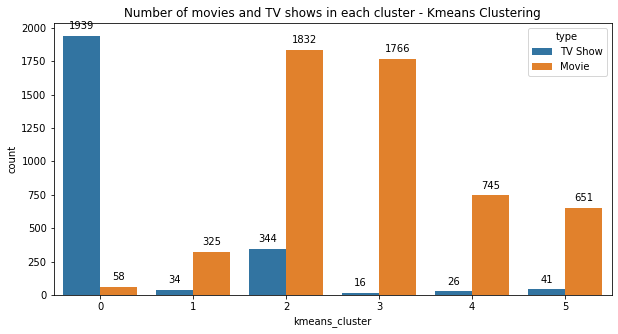

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
q = sns.countplot(x='kmeans_cluster',data=Dataset, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

In [ ]:
# Building a wordcloud for the movie descriptions
def kmeans_worldcloud(cluster_num):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterate through the csv file
  for val in Dataset[Dataset['kmeans_cluster']==cluster_num].description.values:
      
      # typecaste each val to string
      val = str(val)

      # split the value
      tokens = val.split()
      
      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()
      
      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)



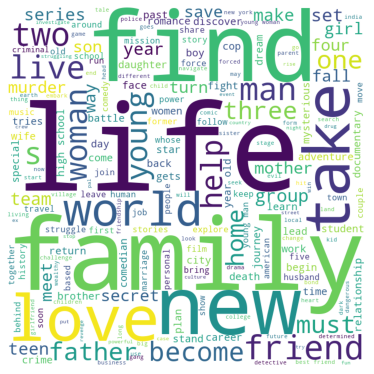

In [ ]:
plt.figure(figsize = (10,5), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

##**2.Hierarchical clustering:**

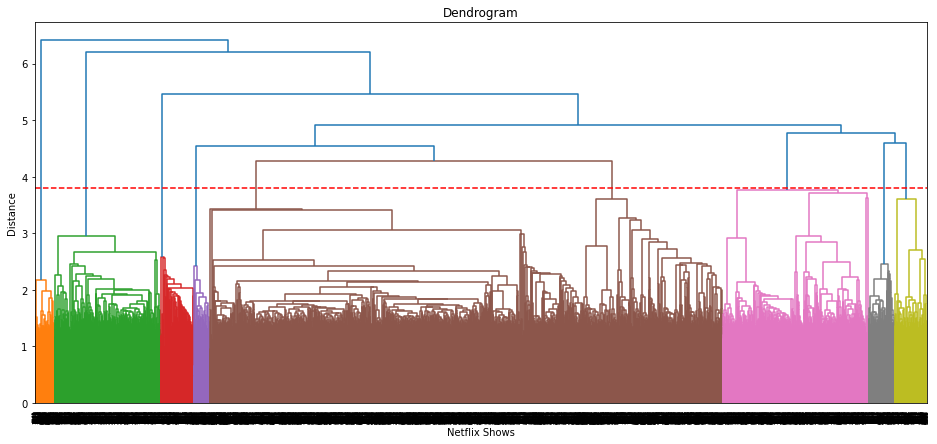

In [ ]:
# Building a dendogram to decide on the number of clusters
plt.figure(figsize=(16, 7))  
dend = shc.dendrogram(shc.linkage(x_pca, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 3.8, color='r', linestyle='--')

In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=12, affinity='euclidean', linkage='ward')  
hierarchical.fit_predict(x_pca)

array([ 0,  0,  1, ...,  4,  4, 10])

In [ ]:
# Adding a kmeans cluster number attribute
Dataset['hierarchical_cluster'] = hierarchical.labels_

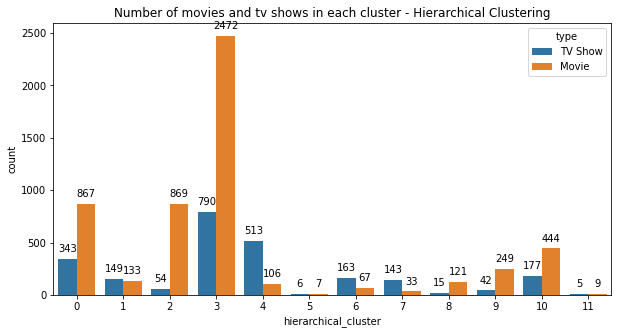

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
q = sns.countplot(x='hierarchical_cluster',data=Dataset, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

In [ ]:
# Building a wordcloud for the movie descriptions
def hierarchical_worldcloud(cluster_num):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterate through the csv file
  for val in Dataset[Dataset['hierarchical_cluster']==cluster_num].description.values:
      
      # typecaste each val to string
      val = str(val)

      # split the value
      tokens = val.split()
      
      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()
      
      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)
  return hierarchical_worldcloud

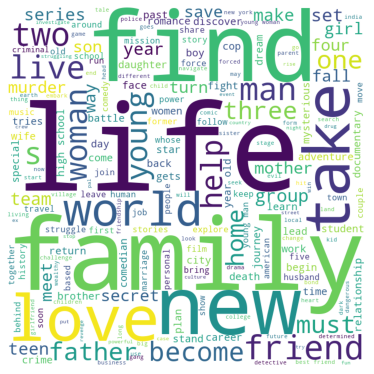

In [ ]:
  # plot the WordCloud image                      
plt.figure(figsize = (10,5), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

# **Using Content based recommender system**

In [ ]:
# Changing the index of the df from show id to show title
Dataset['show_id'] = Dataset.index

In [ ]:
# converting tokens to string
def convert(lst):
  return ' '.join(lst)

Dataset['clustering'] = Dataset['clustering'].apply(lambda x: convert(x))

In [ ]:
# setting title of movies/Tv shows as index
Dataset.set_index('title',inplace=True)

In [ ]:
# Count vectorizer
CV = CountVectorizer()
converted_matrix = CV.fit_transform(Dataset['clustering'])

In [ ]:
# Cosine similarity
cosine_similarity = cosine_similarity(converted_matrix)

In [ ]:
# Dataset Rows & Columns count
cosine_similarity.shape

(7777, 7777)

In [ ]:
# Developing a function to get 10 recommendations for a show
indices = pd.Series(Dataset.index)

def Dataset_10(title, cosine_sim = cosine_similarity):
  try:
    recommend_content = []   
    idx = indices[indices == title].index[0]
    series = pd.Series(cosine_sim[idx]).sort_values(ascending = False)
    top10 = list(series.iloc[1:11].index)
    # list with the titles of the best 10 matching movies
    for i in top10:
      recommend_content.append(list(Dataset.index)[i])
    print("If you liked '"+title+"', you may also enjoy:\n")
    return recommend_content

  except:
    return 'Invalid Entry'

In [ ]:
# Recommendations for 'A Man Called God'
Dataset_10('A Man Called God')

If you liked 'A Man Called God', you may also enjoy:



['One Spring Night',
 'Mr. Sunshine',
 'Rugal',
 'The King: Eternal Monarch',
 'My Mister',
 'Illang: The Wolf Brigade',
 'Extracurricular',
 'The Lies Within',
 'Reply 1994',
 'Private Lives']

In [ ]:
# Recommendations for 'Peaky Blinders'
Dataset_10('Peaky Blinders')

If you liked 'Peaky Blinders', you may also enjoy:



['Rebellion',
 'The Blue Planet: A Natural History of the Oceans',
 'Mega Food',
 'I AM A KILLER: RELEASED',
 'Botched Up Bodies',
 'The Hunt',
 'The Murder Detectives',
 'Inside The Freemasons',
 'Happy Valley',
 'Greatest Events of WWII in Colour']

In [ ]:
# Recommendations for 'Stranger Things'
Dataset_10('Stranger Things')

If you liked 'Stranger Things', you may also enjoy:



['Beyond Stranger Things',
 'Tread',
 'Prank Encounters',
 'Zombie Dumb',
 'Kiss Me First',
 'Henry Danger',
 'Drug Lords',
 'Haunted',
 'Living Undocumented',
 'Million Dollar Beach House']

#**Conclusion**

1-It is intresting to note that the majority of the content avilabel on Netflix consists of movies,However,in recent years, the platfrom has been focusing more on TV Show.

2-Most of these shows are released either at the end or beginning of the year

3-The United States and India are among the Top Five countries that produce all of the availabel  content on the platform. Additionally,out  of thev top ten actor with the maximum content six of them are from india.

4-When it comes to content ratings TV-MA tops the chart indicating the mature content is more popular to netflix.

5-Using the data content base recommender system was created using cosine similarity, which provided recommendation for Movies and TV Show.

#**Future Work**

@ Integrating this dataset with the external sources such as IMBD ratings,books clustring,plant based Type  clustring can lead to numerous intrigunig discovers.

@ By incoprating additional data a more comprehesive recommender system could be devloped .offering enhanced recommendation to users. This system could them be deployed on the web for widespread usage.

# **THANKS**